In [1]:
import supereeg as se
import pandas as pd
import numpy as np
import os
import hypertools as hyp
import plot as plot
import matplotlib
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from scipy import stats
import seaborn as sns
from nilearn import plotting as ni_plt

In [2]:
fig_dir = '../../paper/paper_figs/methods'

In [3]:
ram_data_dir = '../../data/ram'
pyfr_data_dir = '../../data/pyfr'

In [4]:
fig_count = 0

# Redo Method Figures

In [5]:
ave_model = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/ave_mat.mo')
model_1 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/1.mo')
model_2 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/2.mo')
model_3 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/3.mo')
model_4 = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/4.mo')

/usr/local/lib/python3.6/site-packages/supereeg/helpers.py:909: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  X = X.as_matrix()


In [6]:
bo = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/4_sub.bo')
mo = se.load('/Users/lucyowen/Desktop/paper_figures/pyfr/4.mo')
electrode = 46
lower_bound=5
upper_bound=10
e = bo.get_locs().iloc[electrode]

/usr/local/lib/python3.6/site-packages/supereeg/helpers.py:909: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  X = X.as_matrix()


In [7]:
ave_mat = ave_model.get_model(z_transform=False) 

In [8]:
cluster_labels = hyp.cluster(ave_mat, n_clusters=7)

In [9]:
resorted_labels = []
resorted_factor = []
for c in np.arange(7):
    resorted_labels.append([i for i,x in enumerate(cluster_labels) if x == c])
    resorted_factor.append([x for i,x in enumerate(cluster_labels) if x == c])
resorted_inds = np.concatenate(resorted_labels)
resorted_color = np.concatenate(resorted_factor)

In [10]:
resorted_ave_mat = ave_mat[:, resorted_inds][resorted_inds, :]

In [11]:
factor_list = [0]
total = 0
for r in resorted_factor:
    temp_r = len(r)
    total += temp_r
    factor_list.append(total)

In [12]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=6)
c_list = []
for c in np.arange(7):
    c_list.append(list(cm.viridis(norm(c))))

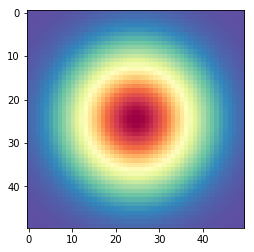

In [13]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plt.imshow(plot.gkern(50), interpolation='none', cmap='Spectral_r')
plt.savefig(outfile)

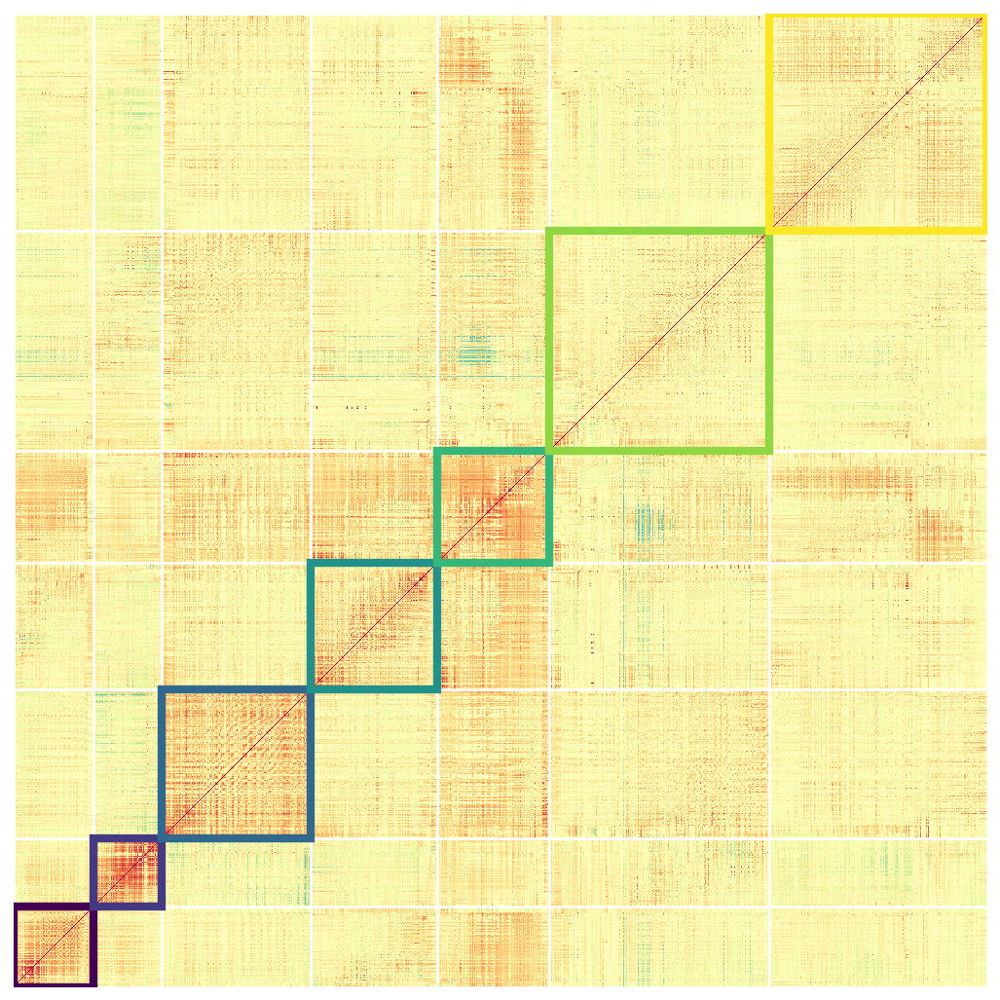

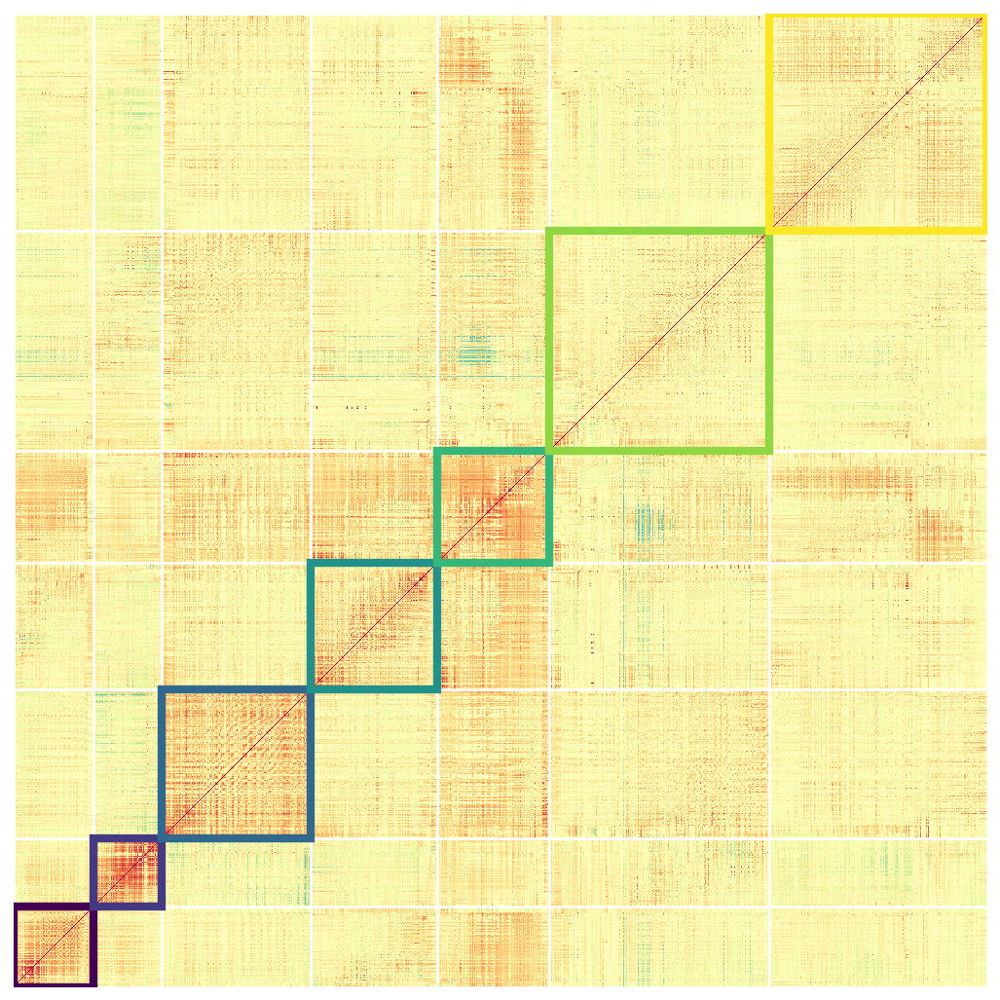

In [14]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
plot._plot_borderless_clustered(resorted_ave_mat, factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)


In [15]:
R = ave_model.get_locs().values
R_resorted = R[resorted_inds]

In [16]:
norm = matplotlib.colors.Normalize(vmin=0, vmax=6)

In [17]:
R_bo = se.helpers.get_rows(R_resorted, bo.get_locs().values)

In [18]:
c_list = []
for c in np.arange(7):
    c_list.append(list(cm.viridis(norm(c))))

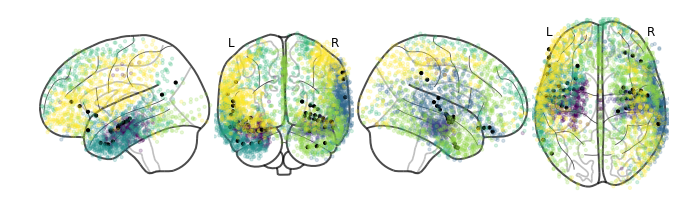

In [19]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')

label = []
sub_list = []
for c in np.arange(7):
    for i, v in enumerate(resorted_color):
        if v == c:
            color_val = list(cm.viridis(norm(c)))
            color_val[3] = .2
            label.append(color_val)
            
            

colors = np.asarray(label)
R_bo = se.helpers.get_rows(R_resorted, bo.get_locs().values)
R_e = se.helpers.get_rows(R_resorted, e.values)
colors[R_e[0]] = np.array([1,0,0,1])
colors[R_bo] = np.array([0,0,0,1])
colors = list(map(lambda x: x[0], np.array_split(colors, colors.shape[0], axis=0)))


ni_plt.plot_connectome(np.eye(R_resorted.shape[0]), R_resorted,
                       node_kwargs={'edgecolors': None}, display_mode='lyrz',
                       node_size=10, node_color=colors)
plt.savefig(outfile)

In [20]:
e_corrs = pd.read_csv(os.path.join(pyfr_data_dir,'pyfr.csv'), index_col=0)

In [21]:
pyfr_locs = plot.compile_df_locs(e_corrs['R'])
corr_pyfr_locs = np.atleast_2d(e_corrs['across'])

In [22]:
R_corr = se.helpers.get_rows(pyfr_locs, R_resorted)

In [23]:
np.shape(R_corr)

(4001,)

In [24]:
R_corr_resort = pyfr_locs[R_corr]
corr_resort = corr_pyfr_locs[:, R_corr]

In [25]:
color_resort_inds = se.helpers.get_rows(R_resorted, pyfr_locs)

In [26]:
resorted_color.shape

(4003,)

In [27]:
# resorted_color_again = resorted_color[R_corr]

In [28]:

# for c in np.arange(7):
#     label = []
#     sub_list = []
#     for i, v in enumerate(resorted_color):
#         if v == c:
#             sub_list.append(R_corr_resort[i])
#             label.append(corr_resort[:, i][0])
            
#     colors = np.asarray(label)
#     R_sub = np.asarray(sub_list)
    
#     print(plot.r2z(colors).mean())
#     nii = se.load('std', vox_size=4)
#     full_locs = nii.get_locs().values
    
#     bo_nii = se.Brain(data=np.atleast_2d(colors), locs=R_sub)
#     nii_bo = se.helpers._brain_to_nifti(bo_nii, nii)
#     ni_plt.plot_glass_brain(nii_bo, colorbar=True, threshold=None, vmax=1, vmin=0)


In [29]:
list(cm.viridis(norm(c)))[3] = .2

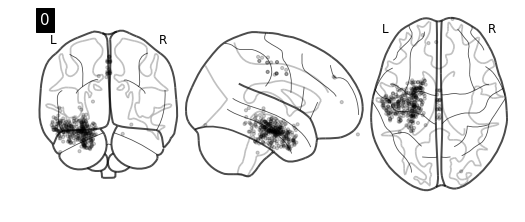

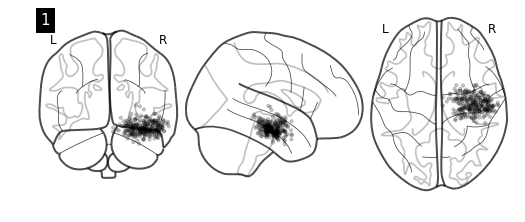

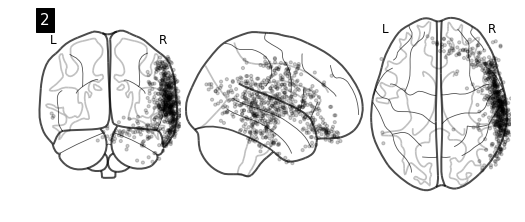

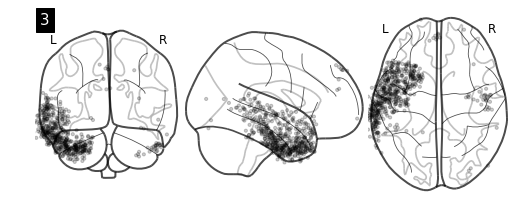

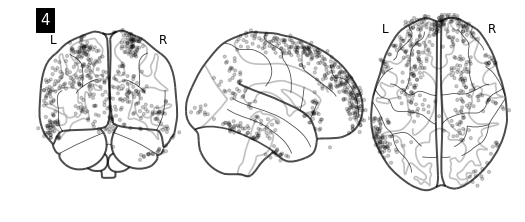

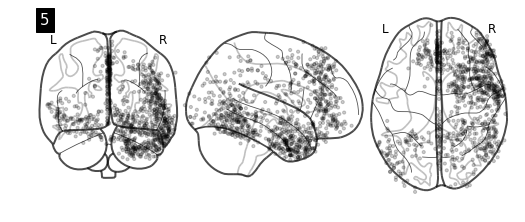

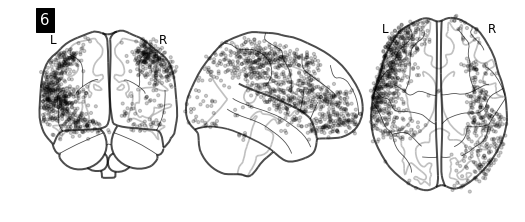

In [30]:

for c in np.arange(7):
    label = []
    sub_list = []
    for i, v in enumerate(resorted_color):
        if v == c:
            sub_list.append(R_resorted[i])
            label.append([0, 0, 0])
    colors = np.asarray(label)
    R_sub = np.asarray(sub_list)
    colors = list(map(lambda x: x[0], np.array_split(colors, colors.shape[0], axis=0)))
    #print(colors)
    outfile = os.path.join(fig_dir, 'factor_' + str(c) + '.png')
    ni_plt.plot_connectome(np.eye(R_sub.shape[0]), R_sub, title=str(c),
                           node_kwargs={'alpha': 0.2, 'edgecolors': None},
                           node_size=10, node_color=colors)
    plt.savefig(outfile)

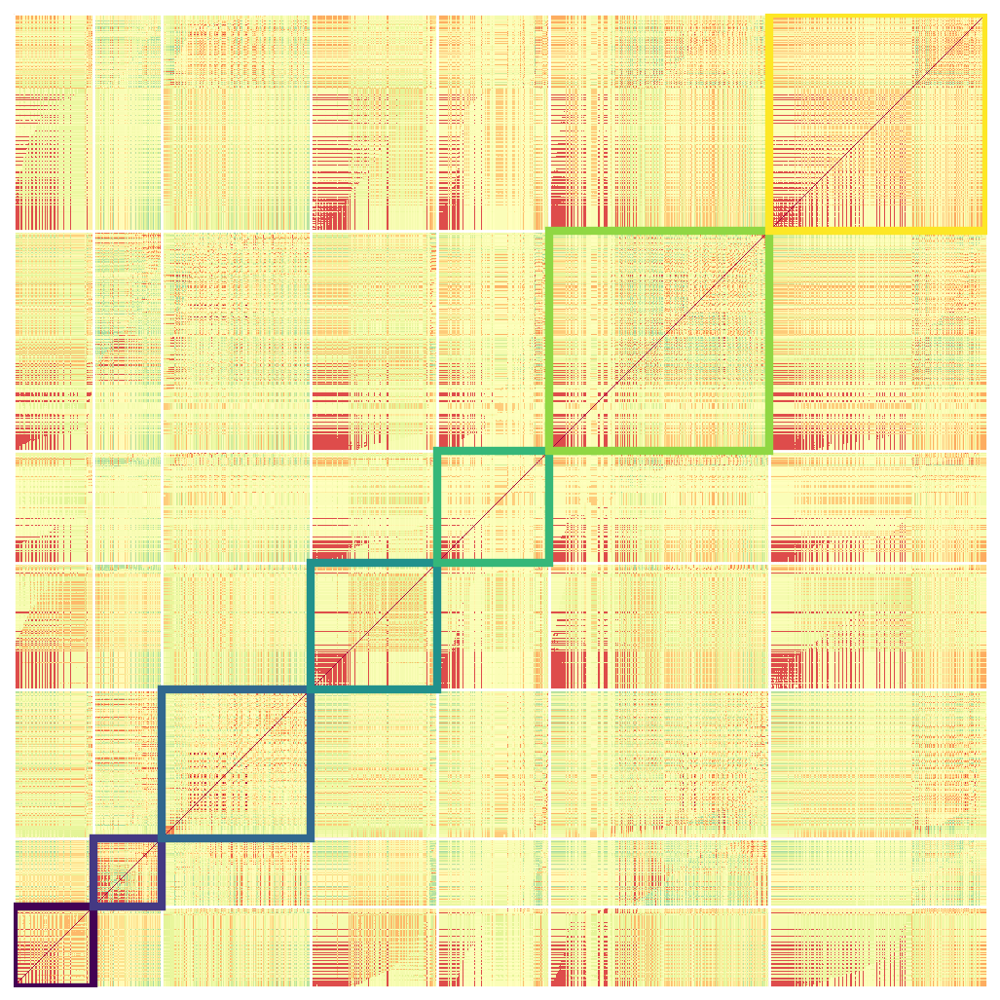

In [31]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_1 = model_1.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_1[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

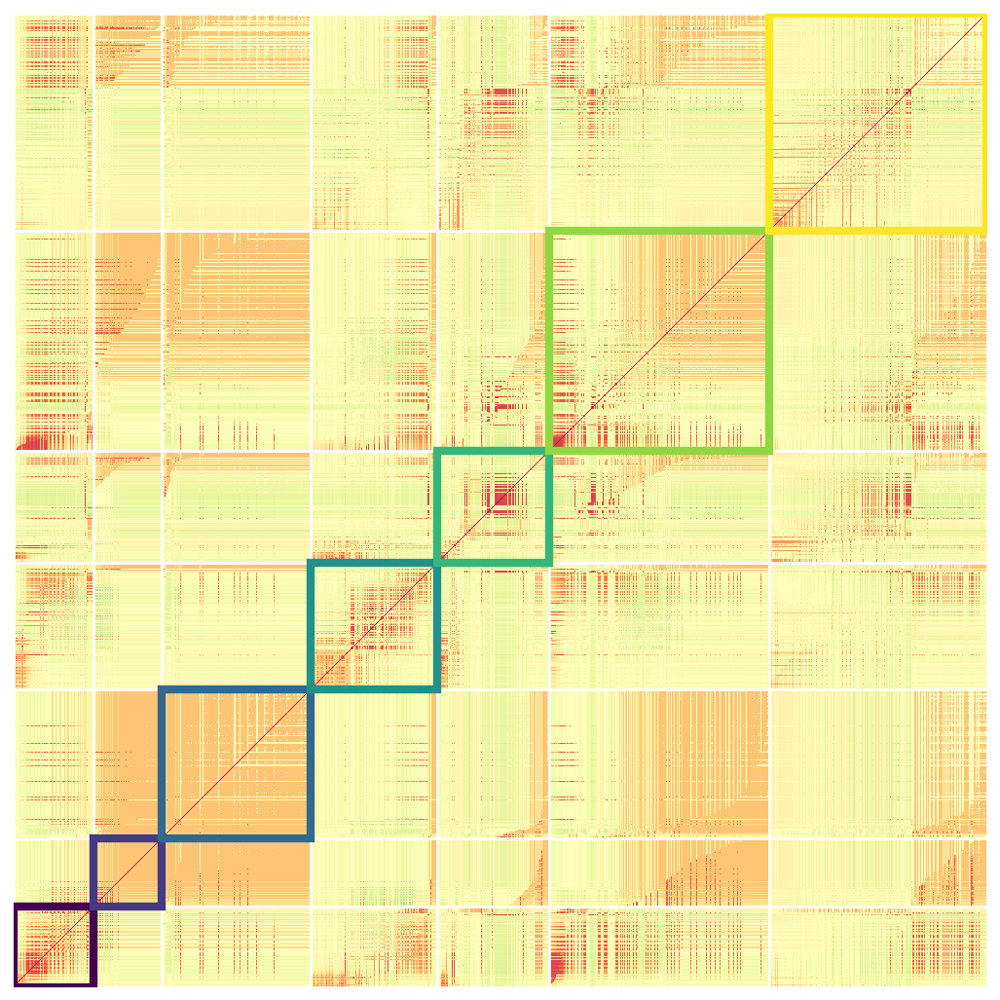

In [32]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_2 = model_2.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_2[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

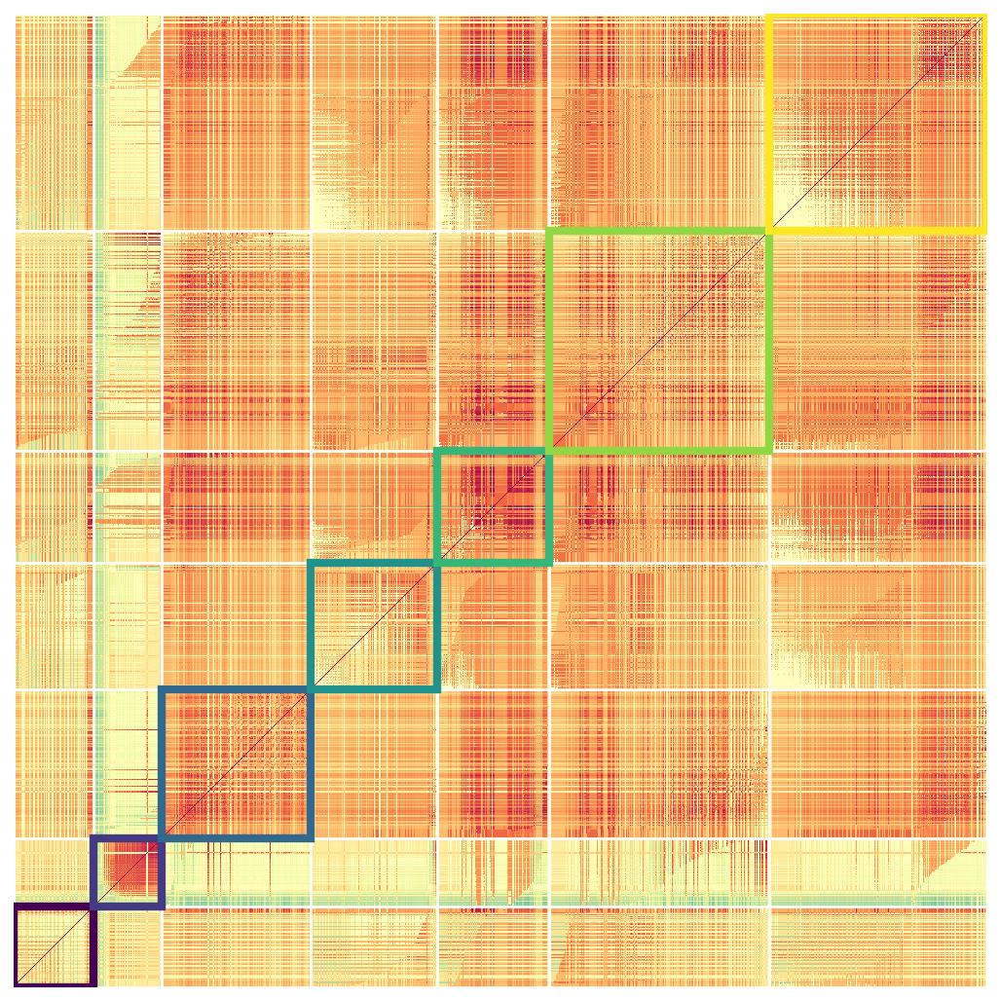

In [33]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_3 = model_3.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_3[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

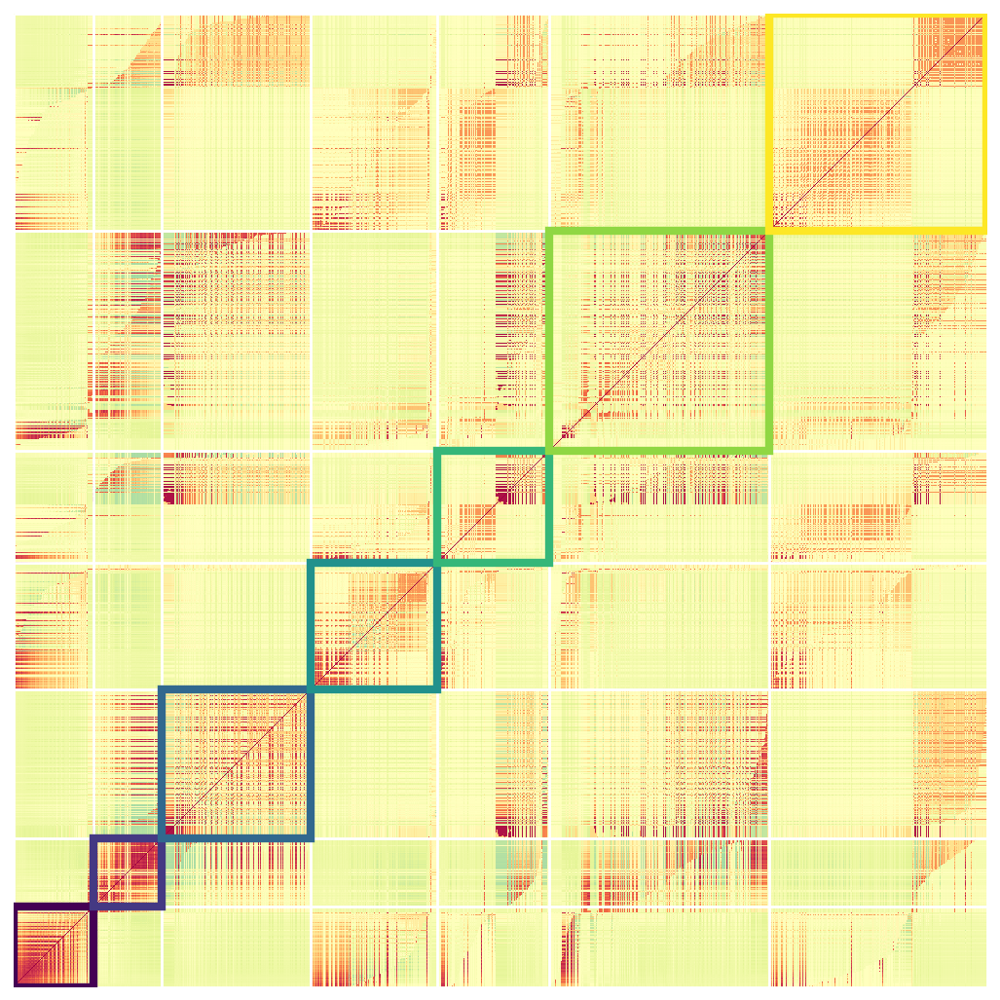

In [34]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.png')
mat_4 = model_4.get_model(z_transform=False) 
ax = plot._plot_borderless_clustered(mat_4[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

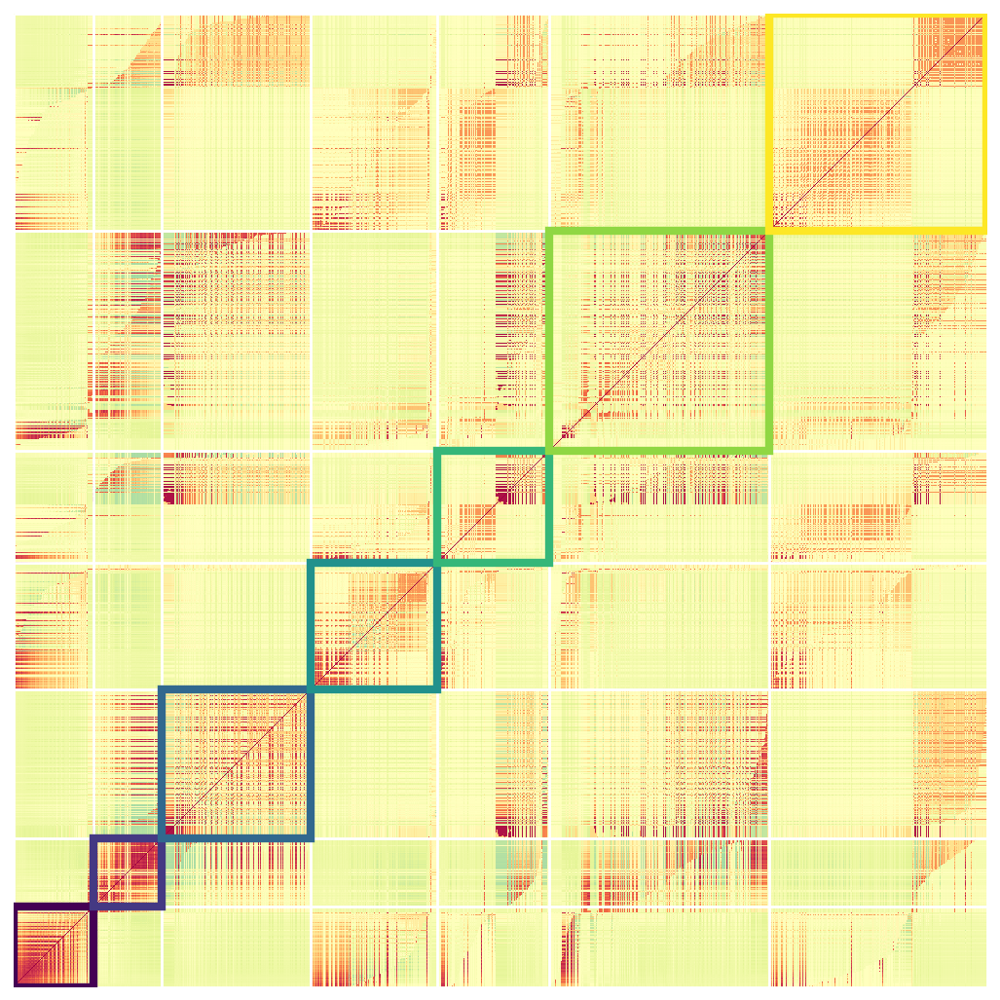

In [35]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '_grouped.png')
ax = plot._plot_borderless_clustered(mat_4[:, resorted_inds][resorted_inds, :], factor_bounds=factor_list, factor_colors=c_list, savefile=outfile)
plt.show()

## Reconstruct UP004 timeseries 

In [36]:
mo_s = ave_model - mo

R = mo.get_locs().as_matrix()

e = bo.get_locs().iloc[electrode]
R_K_subj = bo.get_locs().as_matrix()
R_K_removed, other_inds = se.helpers.remove_electrode(R_K_subj, R_K_subj, electrode)
known_inds, unknown_inds, e_ind = se.helpers.known_unknown(R, R_K_removed, R_K_subj, electrode)

bo.apply_filter()
actual = bo[:,electrode]
bo = bo[:, other_inds]
bo_r = ave_model.predict(bo, recon_loc_inds=e_ind)
c = se.helpers._corr_column(bo_r.data.as_matrix(), actual.get_zscore_data())
print(c)

[0.8966869]


In [37]:
time_data = pd.DataFrame()
time_data['time'] = np.arange(np.shape(actual.get_data())[0])/actual.sample_rate[0]
time_data['actual'] = actual.get_zscore_data()
time_data['predicted'] = bo_r.get_data().values

## Actual vs predicted

[1000. 1200. 1400. 1600. 1800. 2000. 2200. 2400. 2600.]


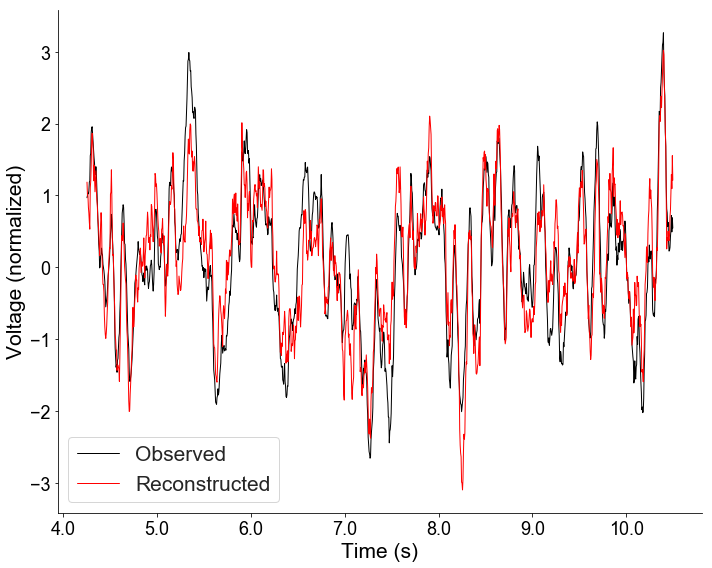

<Figure size 432x288 with 0 Axes>

In [38]:
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plot.plot_times_series(time_data, lower_bound=lower_bound, upper_bound=upper_bound, outfile=outfile)
plt.show()
plt.clf()

In [39]:
# import math
# time_data_df = time_data
# fig, ax = plt.subplots()
# fig.set_size_inches(10, 8)
# sns.set_style("white")
# time_data_df[(time_data_df['time'] > lower_bound) & (time_data_df['time'] < upper_bound)]['actual'].plot(ax=ax, color='k', lw=1, fontsize=21)
# time_data_df[(time_data_df['time'] > lower_bound) & (time_data_df['time'] < upper_bound)]['predicted'].plot(ax=ax, color='r', lw=1)
# ax.legend(['Observed', 'Reconstructed'], fontsize=21)
# ax.set_xlabel("Time (s)", fontsize=21)
# ax.set_ylabel("Voltage (normalized)", fontsize=21)
# ax.tick_params(axis='x', labelsize=18)
# ax.tick_params(axis='y', labelsize=18)
# xvals = ax.get_xticks()
# print(xvals)
# xvals = np.asarray([750, 1000, 1250, 1500, 1750, 2000, 2250, 2500, 2750])

# #ax.set_yticklabels([int(np.round(x / 2, 1)) for x in yvals])
# #ax.set_xticklabels([math.ceil(np.round(x / 250, 4)) for x in xvals])
# ax.set_xticklabels([np.round(x / 250, 4) for x in xvals])

# # for index, label in enumerate(ax.xaxis.get_ticklabels()):
# #     if index == 0:
# #         print(index)     
# #         label.set_visible(True)
# ax.spines['right'].set_visible(False)
# ax.spines['top'].set_visible(False)

# plt.tight_layout()

In [40]:
# import numpy.matlib as mat
# fig = plt.gcf()
# fig.set_size_inches(18.5, 10.5)
# sns.set_style("white")
# mask = (time_data['time'] > lower_bound) & (time_data['time'] < upper_bound)
# Y = stats.zscore(bo.get_data())
# added = mat.repmat(1 + np.arange(Y.shape[1])*2, Y.shape[0], 1)
# Y = pd.DataFrame(Y+ added)
# ax = Y[Y.columns][mask].plot(legend=False, title=None, fontsize=21, color='k', lw=.6)

# Y[Y.columns[int(electrode)]][mask].plot(color='b', lw=.8)
# ax.tick_params(axis='x', labelsize=18)
# ax.tick_params(axis='y', labelsize=18)
# yvals = ax.get_yticks()
# ax.set_yticklabels([int(np.round(x / 2, 1)) for x in yvals])
# xvals = ax.get_xticks()
# ax.set_xticklabels([np.round(x / bo.sample_rate[0], 4) for x in xvals])
# ax.set_frame_on(False)
# ax.set_xlabel("Time", fontsize=21)
# ax.set_ylabel("Electrodes", fontsize=21)
# ax.set_ylim([-4, len(Y.columns) * 2 + 4])
# ax.tick_params(axis='x', labelsize=18)
# ax.tick_params(axis='y', labelsize=18)

## Normed electrode activity

<Figure size 1332x756 with 0 Axes>

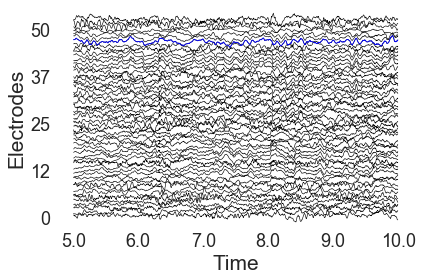

In [41]:
plt.clf()
fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
plot.plot_Y_electrode(time_data= time_data, bo=bo, lower_bound=lower_bound, upper_bound=upper_bound, electrode=electrode, outfile=outfile)


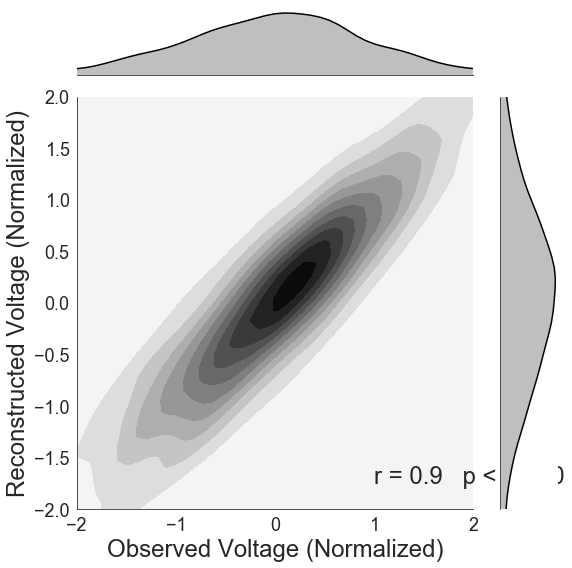

In [42]:
### this actually needs to be computed in full on the cluster

fig_count +=1
outfile = os.path.join(fig_dir, str(fig_count) + '.pdf')
sns.set_style("white")
#g, ax = plt.subplots()
g = (sns.jointplot(x = actual.get_zscore_data(), y=bo_r.data.as_matrix(), kind="kde", color='k', xlim = (-2,2), ylim = (-2,2), height=8).set_axis_labels('Observed Voltage (Normalized)', 'Reconstructed Voltage (Normalized)', fontsize=24))
ax = g.ax_joint
left, width = .75, .5
bottom, height = .05, .5
rstat = stats.pearsonr(bo_r.get_data().as_matrix(), actual.get_zscore_data())
# ax = plt.gca()
# ax.set_ylabel('Reconstructed Voltage (Normalized)', fontsize=24)
# ax.set_xlabel('Observed Voltage (Normalized)', fontsize=24)
ax.tick_params(axis='x', labelsize=18)
ax.tick_params(axis='y', labelsize=18)
ax.text(left, bottom, 'r = ' + str(np.round(rstat[0][0],2))+ '   p < '+ str(10**-10),
        horizontalalignment='left',
        verticalalignment='bottom',
        transform=ax.transAxes, fontsize=24)
    
plt.tight_layout()

plt.savefig(outfile)


